**Wine Quality Dataset**

*The Wine Quality dataset is a comprehensive collection of data pertaining to various chemical properties of wines and their corresponding quality ratings.This dataset is widely used for predictive modeling, data analysis, and machine learning applications. It consists of 6497 entries (rows) and 13 features (columns), each providing valuable insights into different characteristics of the wines.*

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
import pandas as pd  #for data manipulation operations
import numpy as np  #for numeric operations on data
import seaborn as sns  #for data visualization operations
import matplotlib.pyplot as plt  #for data visualization operations
from sklearn.preprocessing import LabelEncoder # for encoding
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler #for standardization
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import scipy.stats as st


#from markupsafe import escape
#!pip install pandas-profiling
#import pandas_profiling

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix
from sklearn import model_selection
from sklearn.neighbors import KNeighborsClassifier

#!pip install lightgbm


#ignore warnings
import warnings
warnings.filterwarnings("ignore")

#see model parametres
from sklearn import set_config
set_config(print_changed_only = False)


***Introduction***

*the wine quality dataset contains of 6497 `rows` and `13` columns*

**Description of Columns :**

`Type`: This column indicates the type of wine, typically categorized as either red or white.

`Fixed Acidity`: This feature represents the amount of fixed acids, such as tartaric, malic, citric, and others, present in the wine, measured in grams per deciliter.

`Volatile Acidity`: This column measures the amount of acetic acid in wine, which at high levels can lead to an unpleasant vinegar taste, measured in grams per deciliter.

`Citric Acid`: Citric acid content in the wine, which can add freshness and flavor, measured in grams per deciliter.

`Residual Sugar`: The amount of sugar remaining after fermentation stops, measured in grams per liter. This can affect the sweetness of the wine.

`Chlorides`: The amount of chloride (salt) in the wine, measured in grams per liter. High levels can affect the taste and preservation.

`Free Sulfur Dioxide`: The amount of free form of SO2 in wine, which prevents microbial growth and oxidation, measured in milligrams per liter.

`Total Sulfur Dioxide`: The total amount of SO2, both free and bound forms, in wine, measured in milligrams per liter. This ensures wine stability and preservation.

`Density`: The density of the wine, which is close to that of water, measured in grams per cubic centimeter. It gives an indication of the wine's sugar and alcohol content.

`pH`: The pH level of the wine, indicating its acidity or alkalinity.

`Sulphates`: Sulphate content in the wine, which can contribute to the wine's sulfur dioxide levels, measured in grams per liter.

`Alcohol`: The alcohol content of the wine, measured as a percentage by volume.

`Quality`: The quality rating of the wine, usually scored between 0 and 10, as determined by wine experts.*

In [7]:
df = pd.read_csv("C:\\Users\\Krishna Prasad Tella\\OneDrive\\Desktop\\winequalityN.csv")

In [8]:
df.style.background_gradient(cmap = "magma")

Color the background in a gradient style.

The background color is determined according to the data in each column, row or frame, or by a given gradient map. Requires matplotlib
(cmapstr or colormap
Matplotlib colormap.)

In [9]:
df.head(10).style.background_gradient(cmap = "rocket")

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.000000,0.270000,0.360000,20.700000,0.045000,45.000000,170.000000,1.001000,3.000000,0.450000,8.800000,6
1,white,6.300000,0.300000,0.340000,1.600000,0.049000,14.000000,132.000000,0.994000,3.300000,0.490000,9.500000,6
2,white,8.100000,0.280000,0.400000,6.900000,0.050000,30.000000,97.000000,0.995100,3.260000,0.440000,10.100000,6
3,white,7.200000,0.230000,0.320000,8.500000,0.058000,47.000000,186.000000,0.995600,3.190000,0.400000,9.900000,6
4,white,7.200000,0.230000,0.320000,8.500000,0.058000,47.000000,186.000000,0.995600,3.190000,0.400000,9.900000,6
5,white,8.100000,0.280000,0.400000,6.900000,0.050000,30.000000,97.000000,0.995100,3.260000,0.440000,10.100000,6
6,white,6.200000,0.320000,0.160000,7.000000,0.045000,30.000000,136.000000,0.994900,3.180000,0.470000,9.600000,6
7,white,7.000000,0.270000,0.360000,20.700000,0.045000,45.000000,170.000000,1.001000,3.000000,0.450000,8.800000,6
8,white,6.300000,0.300000,0.340000,1.600000,0.049000,14.000000,132.000000,0.994000,3.300000,0.490000,9.500000,6
9,white,8.100000,0.220000,0.430000,1.500000,0.044000,28.000000,129.000000,0.993800,3.220000,0.450000,11.000000,6


In [10]:
df.describe().T.style.background_gradient(cmap = "magma")

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6487.000000,7.216579,1.296750,3.800000,6.400000,7.000000,7.700000,15.900000
volatile acidity,6489.000000,0.339691,0.164649,0.080000,0.230000,0.290000,0.400000,1.580000
citric acid,6494.000000,0.318722,0.145265,0.000000,0.250000,0.310000,0.390000,1.660000
residual sugar,6495.000000,5.444326,4.758125,0.600000,1.800000,3.000000,8.100000,65.800000
chlorides,6495.000000,0.056042,0.035036,0.009000,0.038000,0.047000,0.065000,0.611000
free sulfur dioxide,6497.000000,30.525319,17.749400,1.000000,17.000000,29.000000,41.000000,289.000000
total sulfur dioxide,6497.000000,115.744574,56.521855,6.000000,77.000000,118.000000,156.000000,440.000000
density,6497.000000,0.994697,0.002999,0.987110,0.992340,0.994890,0.996990,1.038980
pH,6488.000000,3.218395,0.160748,2.720000,3.110000,3.210000,3.320000,4.010000
sulphates,6493.000000,0.531215,0.148814,0.220000,0.430000,0.510000,0.600000,2.000000


*created a new column name `type_in_num` using `type` columns in the data set as that will be easy in machine learning to understand*

In [11]:
df_type =[]
for i in df["type"]:
  if i=="white":
    df_type.append(1)
  else:
    df_type.append(0)

In [12]:
df["type_in_num"]=df_type
df.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
type_in_num              0
dtype: int64

In [13]:
print("Totally there are {} null values in the dataset".format(df.isnull().sum().sum()))

Totally there are 38 null values in the dataset


**Droped all tha null values in the data set as i had no intenction to create new data set used inplace = True in it**

In [14]:
df.dropna(inplace=True)

In [15]:
print("Totally there are {} null values in the dataset".format(df.isnull().sum().sum()))

Totally there are 0 null values in the dataset


In [16]:
df.shape

(6463, 14)

**the shape of the data frame after droping the null values and creating new column is `6463` rows and `14` columns**

In [17]:
df.isnull().sum().sum()

0

In [18]:
df.columns

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality', 'type_in_num'],
      dtype='object')

**these are the columns existed in data frame after adding and cleaning of the data**

**the columns names are :**

*'type', 'fixed acidity', 'volatile acidity', 'citric acid','residual sugar', 'chlorides', 'free sulfur dioxide','total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol','quality', 'type_in_num'*

In [19]:
df1=df.drop(["type"],axis=1)
df1.head().T.style.background_gradient(cmap = "magma")

,0,1,2,3,4
fixed acidity,7.000000,6.300000,8.100000,7.200000,7.200000
volatile acidity,0.270000,0.300000,0.280000,0.230000,0.230000
citric acid,0.360000,0.340000,0.400000,0.320000,0.320000
residual sugar,20.700000,1.600000,6.900000,8.500000,8.500000
chlorides,0.045000,0.049000,0.050000,0.058000,0.058000
free sulfur dioxide,45.000000,14.000000,30.000000,47.000000,47.000000
total sulfur dioxide,170.000000,132.000000,97.000000,186.000000,186.000000
density,1.001000,0.994000,0.995100,0.995600,0.995600
pH,3.000000,3.300000,3.260000,3.190000,3.190000
sulphates,0.450000,0.490000,0.440000,0.400000,0.400000


In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6463 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6463 non-null   float64
 1   volatile acidity      6463 non-null   float64
 2   citric acid           6463 non-null   float64
 3   residual sugar        6463 non-null   float64
 4   chlorides             6463 non-null   float64
 5   free sulfur dioxide   6463 non-null   float64
 6   total sulfur dioxide  6463 non-null   float64
 7   density               6463 non-null   float64
 8   pH                    6463 non-null   float64
 9   sulphates             6463 non-null   float64
 10  alcohol               6463 non-null   float64
 11  quality               6463 non-null   int64  
 12  type_in_num           6463 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 706.9 KB


In [21]:
df1.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
type_in_num             0
dtype: int64

**Created the new data frame by droping the type as it will be easy for the algorithm easy to understand as the remaing all are `numerical`**

**Value counts of the All columns:**

*for understanding the data we had done value counts to what are they in numbers*

In [22]:
df1['type_in_num'].value_counts()

type_in_num
1    4870
0    1593
Name: count, dtype: int64

In [23]:
df1['fixed acidity'].value_counts()

fixed acidity
6.80     352
6.60     326
6.40     302
7.00     281
6.90     279
        ... 
3.90       1
3.80       1
6.45       1
4.50       1
12.10      1
Name: count, Length: 106, dtype: int64

In [24]:
df1['volatile acidity'].value_counts()

volatile acidity
0.280    285
0.240    264
0.260    255
0.250    238
0.220    233
        ... 
0.930      1
0.975      1
0.905      1
0.825      1
0.135      1
Name: count, Length: 187, dtype: int64

In [25]:
df1['citric acid'].value_counts()

citric acid
0.30    337
0.28    299
0.32    289
0.49    283
0.26    256
       ... 
0.99      1
1.23      1
0.86      1
0.88      1
0.75      1
Name: count, Length: 89, dtype: int64

In [26]:
df1['residual sugar'].value_counts()

residual sugar
2.00     235
1.80     227
1.60     222
1.40     218
1.20     193
        ... 
12.05      1
6.95       1
9.55       1
20.15      1
3.45       1
Name: count, Length: 315, dtype: int64

In [27]:
df1['chlorides'].value_counts()

chlorides
0.044    203
0.036    199
0.042    187
0.046    183
0.040    182
        ... 
0.209      1
0.149      1
0.144      1
0.013      1
0.230      1
Name: count, Length: 214, dtype: int64

In [28]:
df1['free sulfur dioxide'].value_counts()

free sulfur dioxide
29.0     180
6.0      170
26.0     161
15.0     157
24.0     151
        ... 
30.5       1
138.5      1
95.0       1
124.0      1
88.0       1
Name: count, Length: 135, dtype: int64

In [29]:
df1['density'].value_counts()

density
0.99720    69
0.99760    69
0.99800    64
0.99200    63
0.99280    62
           ..
0.98922     1
0.99393     1
0.99284     1
0.98884     1
0.99651     1
Name: count, Length: 996, dtype: int64

In [30]:
df1['pH'].value_counts()

pH
3.16    200
3.14    193
3.22    185
3.20    176
3.19    170
       ... 
2.72      1
3.85      1
3.82      1
3.81      1
3.79      1
Name: count, Length: 108, dtype: int64

In [31]:
df1['sulphates'].value_counts()

sulphates
0.50    271
0.46    242
0.54    233
0.44    231
0.38    213
       ... 
1.20      1
1.56      1
0.23      1
0.22      1
1.33      1
Name: count, Length: 111, dtype: int64

In [32]:
df1['alcohol'].value_counts()

alcohol
9.500000     366
9.400000     330
9.200000     271
10.000000    228
10.500000    227
            ... 
10.533333      1
11.366667      1
12.333333      1
14.050000      1
10.750000      1
Name: count, Length: 111, dtype: int64

In [33]:
quality = df['quality']
quality.describe()

count    6463.000000
mean        5.818505
std         0.873286
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         9.000000
Name: quality, dtype: float64

In [34]:
df1['quality'].value_counts()

quality
6    2820
5    2128
7    1074
4     214
8     192
3      30
9       5
Name: count, dtype: int64

**DATA VISUALIZATION 📉**

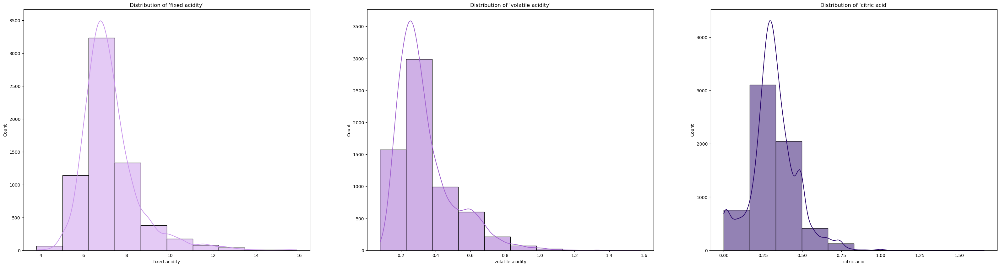

In [35]:
fig, axes = plt.subplots(1, 3, figsize = (40, 10))

sns.histplot(ax = axes[0], x = df["fixed acidity"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#CA96EC").set(title = "Distribution of 'fixed acidity'");

sns.histplot(ax = axes[1], x = df["volatile acidity"],
             bins = 10,
             cbar = True,
             kde = True,
             color = "#A163CF").set(title = "Distribution of 'volatile acidity'");

sns.histplot(ax = axes[2], x = df["citric acid"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#29066B").set(title = "Distribution of 'citric acid'");

**from the histplot understood that the most of the Datapoints wine are in `fixed acidity` ,`voliatile acidity`, `citric acidity`**

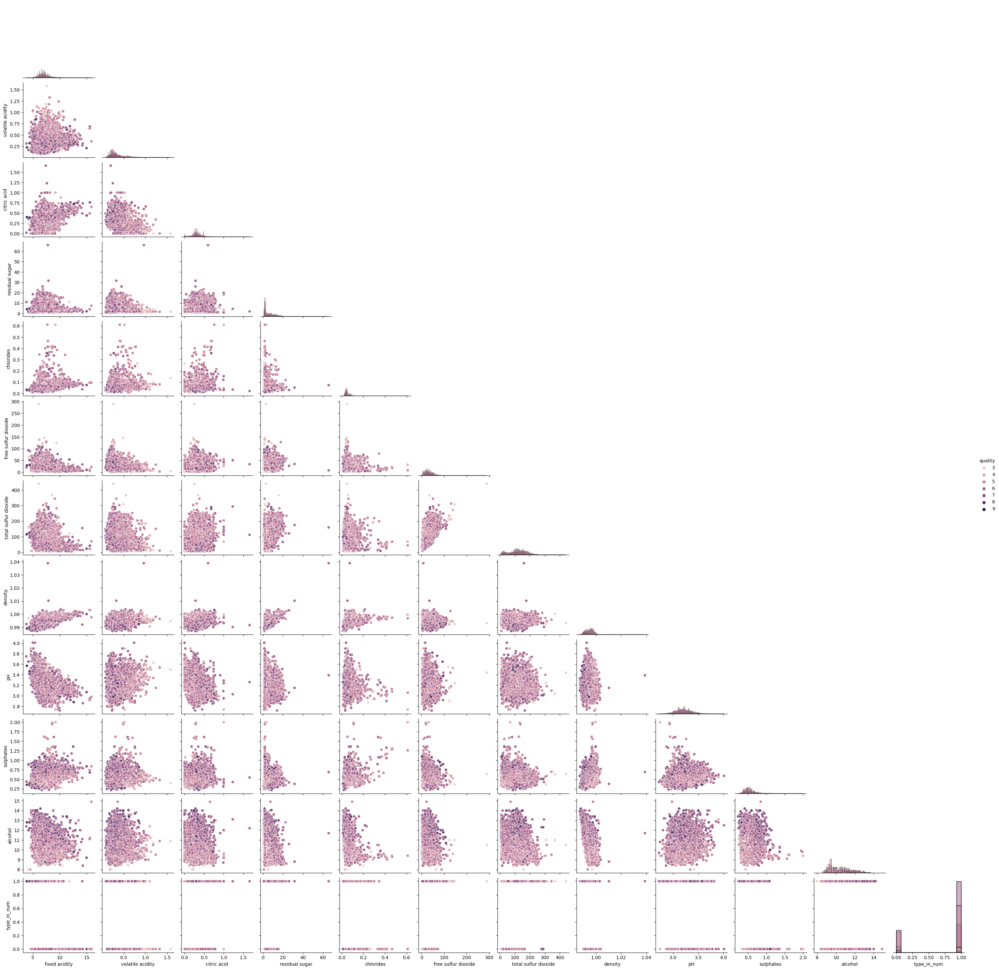

In [36]:
sns.pairplot(df,diag_kind = "hist", hue = "quality" ,corner = True);

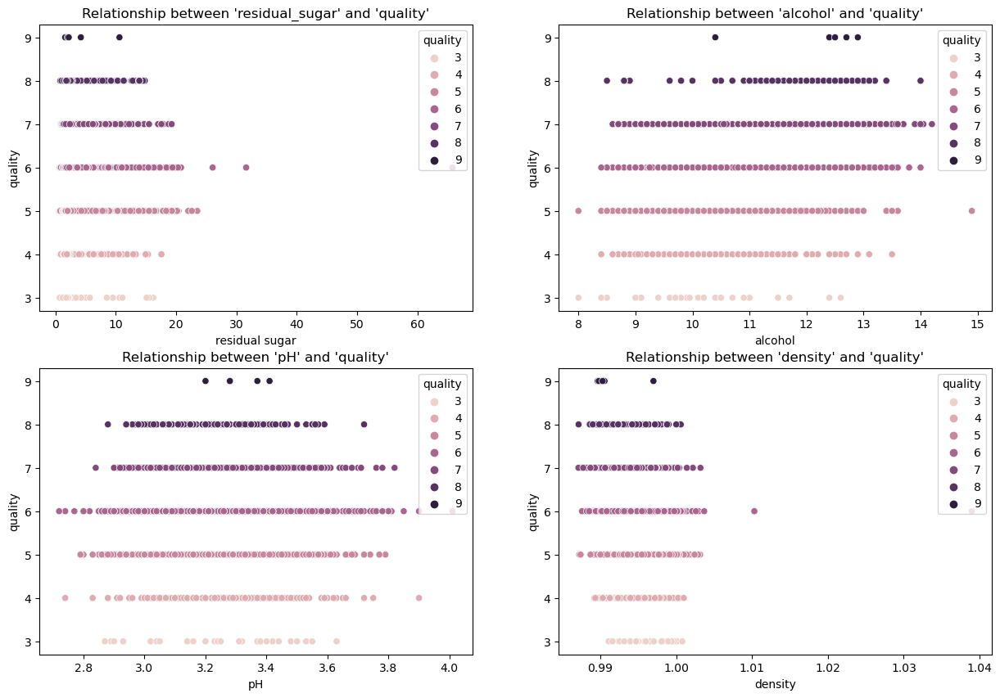

In [37]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

sns.scatterplot(ax = axes[0],
                x = "residual sugar",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'residual_sugar' and 'quality'");

sns.scatterplot(ax = axes[1],
                x = "alcohol",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'alcohol' and 'quality'");

sns.scatterplot(ax = axes[2],
                x = "pH",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'pH' and 'quality'");

sns.scatterplot(ax = axes[3],
                x = "density",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'density' and 'quality'");

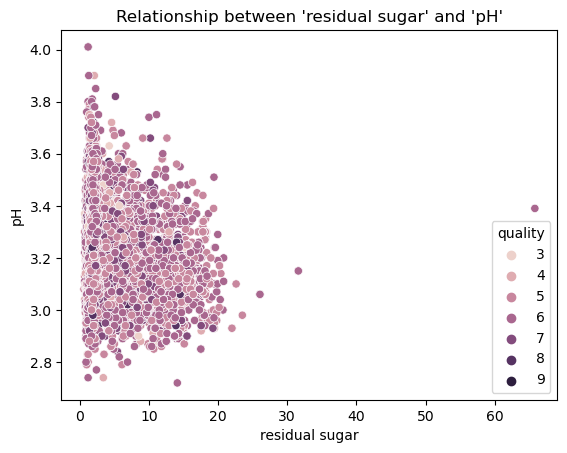

In [38]:
sns.scatterplot(x = "residual sugar",
                y = "pH",
                hue = "quality",
                data = df).set(title = "Relationship between 'residual sugar' and 'pH'");

*from the above scatterplot we understood that ph does not depend on residual sugar*

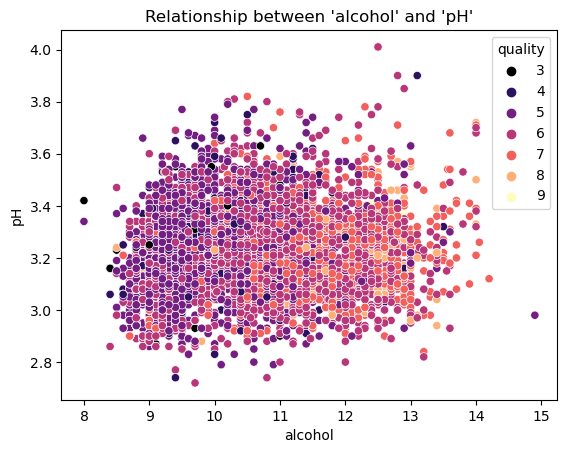

In [39]:
sns.scatterplot(x = "alcohol",
                y = "pH",
                hue = "quality",
                palette = "magma",
                data = df).set(title = "Relationship between 'alcohol' and 'pH'");

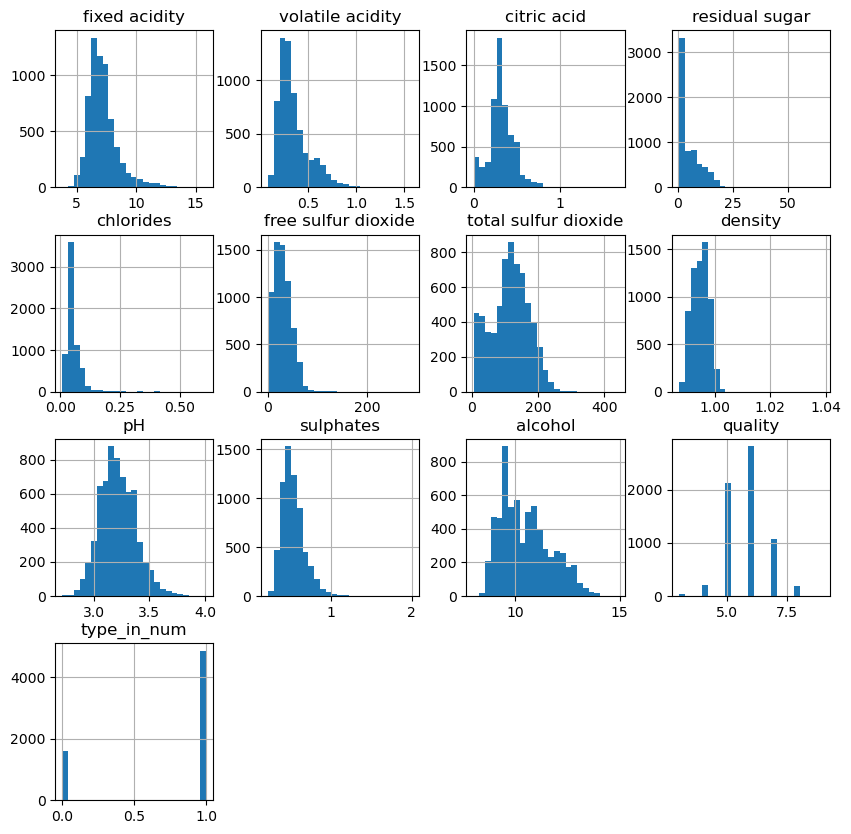

In [40]:
df.hist(bins=25,figsize=(10,10))
# display histogram
plt.show()

Text(0, 0.5, 'alcohol')

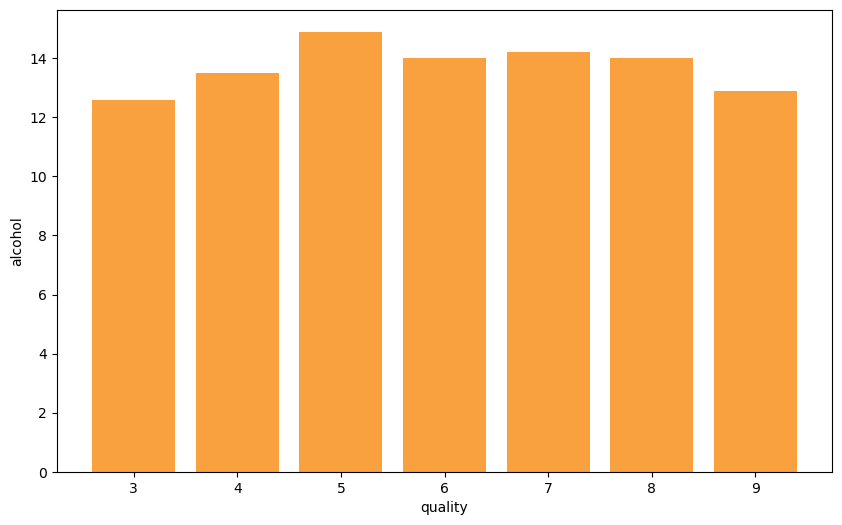

In [41]:
plt.figure(figsize=[10,6])
# plot bar graph
plt.bar(df['quality'],df['alcohol'],color='#F9A03F')
# label x-axis
plt.xlabel('quality')
#label y-axis
plt.ylabel('alcohol')


<Axes: >

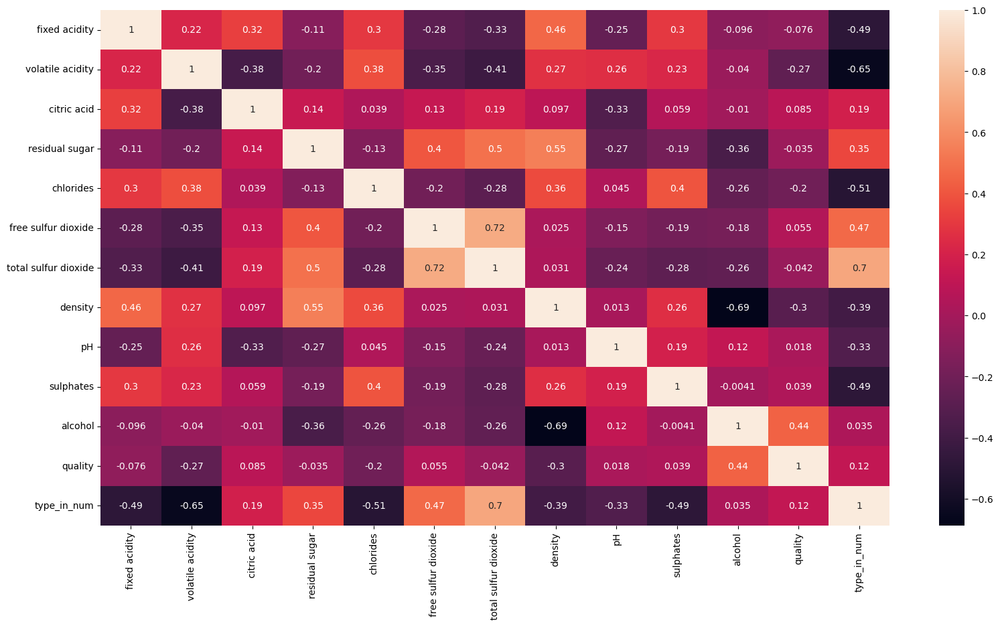

In [42]:
# ploting heatmap(Classification)
plt.figure(figsize=[19,10])
sns.heatmap(df1.corr(),annot=True)

**Classifier**
*creating the input and output data in two different data frames x and y
after creating x and y splited them into x_test,xtrain,y_test,y_train with train size of 75% used random state not to change data
then used robustscalar for fitting the data
the classification is done using knn classifier algorithm,Decision tree classifier algorithm, Logistic regression*

In [43]:
x = df1.drop(["type_in_num"],axis=1)
y = df1["type_in_num"]

In [44]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=40)

In [45]:
from sklearn.preprocessing import RobustScaler
# creating normalization object
norm = RobustScaler()
# fit data
norm_fit = norm.fit(x_train)
X_train = norm_fit.transform(x_train)
X_test = norm_fit.transform(x_test)
# display values
print(X_train)

[[-0.53846154  0.27777778  0.33333333 ... -0.11764706 -0.33333333
  -1.        ]
 [-0.15384615  1.22222222 -2.         ...  0.29411765 -0.44444444
   0.        ]
 [-0.38461538 -0.72222222  0.13333333 ... -0.70588235  0.61111111
   1.        ]
 ...
 [ 0.07692308  0.94444444 -0.73333333 ...  0.76470588  0.05555556
   0.        ]
 [ 0.          0.77777778 -1.93333333 ...  1.76470588  0.16666667
   0.        ]
 [-0.46153846  0.16666667 -0.26666667 ...  1.17647059  1.22222222
   0.        ]]


**Classifier**

**KNN Classifier:-**
we had done

In [46]:

from sklearn.neighbors import KNeighborsClassifier

classifier1 = KNeighborsClassifier()

classifier1.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [47]:
# KNN with different parameters
classifier2 = KNeighborsClassifier(n_neighbors=int(np.sqrt(X_train.shape[0])),
                                  weights="distance",
                                  algorithm="kd_tree",
                                  p=10,
                                  metric="minkowski")

classifier2.fit(X_train, y_train)

KNeighborsClassifier(algorithm='kd_tree', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=69, p=10,
                     weights='distance')

In [48]:
# KNN with different parameters
classifier3 = KNeighborsClassifier(n_neighbors=int(np.sqrt(X_train.shape[0])),
                                  weights="distance",
                                  algorithm="ball_tree",
                                  p=10,
                                  metric="minkowski")

classifier3.fit(X_train, y_train)

KNeighborsClassifier(algorithm='ball_tree', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=69, p=10,
                     weights='distance')

In [49]:
# Classes known to classifier
classifier1.classes_, classifier2.classes_, classifier3.classes_

(array([0, 1], dtype=int64),
 array([0, 1], dtype=int64),
 array([0, 1], dtype=int64))

In [50]:
classifier1.effective_metric_, classifier2.effective_metric_, classifier3.effective_metric_

('euclidean', 'minkowski', 'minkowski')

In [51]:
classifier1.n_features_in_, classifier2.n_features_in_, classifier3.n_features_in_

(12, 12, 12)

In [52]:
%%time
y_test_pred1 = classifier1.predict(X_test)
y_test_pred2 = classifier2.predict(X_test)
y_test_pred3 = classifier3.predict(X_test)

CPU times: total: 3.03 s
Wall time: 4.36 s


In [53]:
# Calculate accuracy of class predictions
from sklearn import metrics

print("KNN Version 1:",metrics.accuracy_score(y_test, y_test_pred1))
print("KNN Version 2:",metrics.accuracy_score(y_test, y_test_pred2))
print("KNN Version 3:",metrics.accuracy_score(y_test, y_test_pred3))

KNN Version 1: 0.9913366336633663
KNN Version 2: 0.9808168316831684
KNN Version 3: 0.9808168316831684


In [54]:
# Visualizing Normalized Heat Map
cm1 = metrics.confusion_matrix(y_test, y_test_pred1, labels=classifier1.classes_)
cm2 = metrics.confusion_matrix(y_test, y_test_pred2, labels=classifier2.classes_)
cm3 = metrics.confusion_matrix(y_test, y_test_pred3, labels=classifier3.classes_)

In [55]:
fig1 = metrics.ConfusionMatrixDisplay(cm1, display_labels=classifier1.classes_)
fig2 = metrics.ConfusionMatrixDisplay(cm2, display_labels=classifier2.classes_)
fig3 = metrics.ConfusionMatrixDisplay(cm3, display_labels=classifier3.classes_)

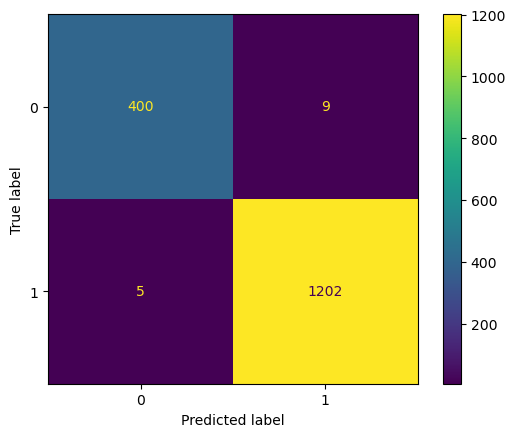

In [56]:
fig1.plot()

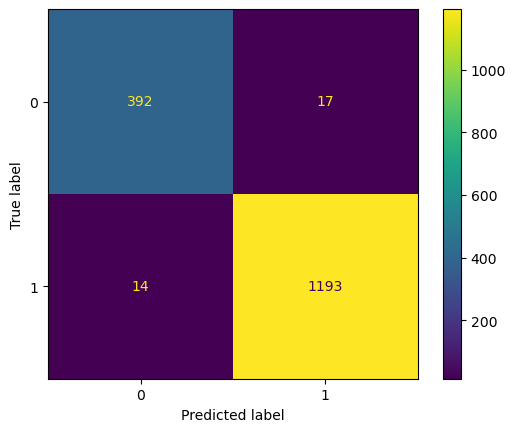

In [57]:
fig2.plot()

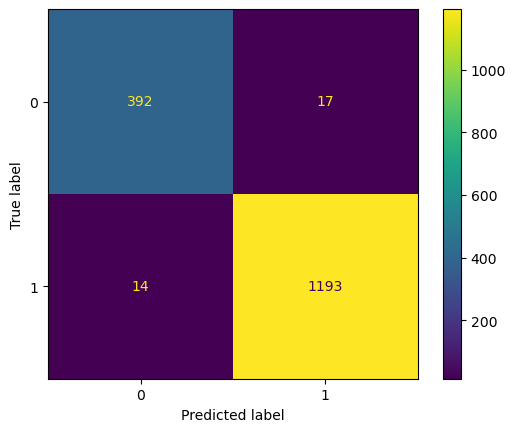

In [58]:
fig3.plot()

In [59]:
# Normalizing the matrix
actual1 = np.sum(cm1, axis=1).reshape(-1, 1)
cmn1 = np.round(cm1/actual1, 2)

actual2 = np.sum(cm2, axis=1).reshape(-1, 1)
cmn2 = np.round(cm2/actual2, 2)

actual3 = np.sum(cm3, axis=1).reshape(-1, 1)
cmn3 = np.round(cm3/actual3, 2)

Text(0.5, 23.52222222222222, 'Predicted')

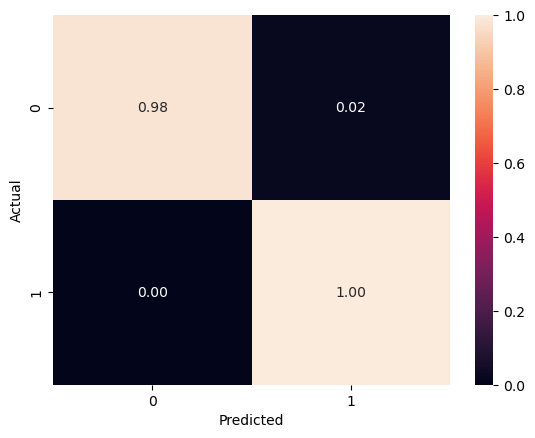

In [60]:
sns.heatmap(cmn1, annot=True, fmt='.2f', xticklabels=classifier1.classes_, yticklabels=classifier1.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')

Text(0.5, 23.52222222222222, 'Predicted')

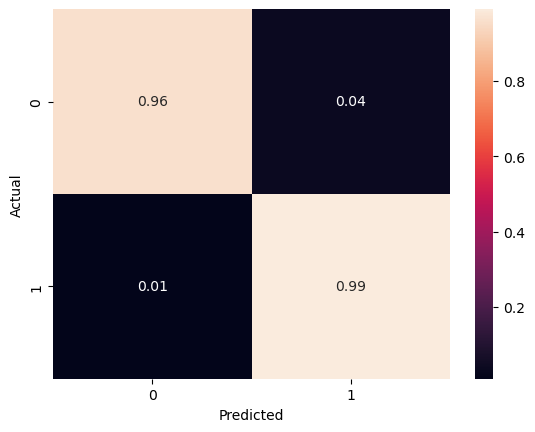

In [61]:
sns.heatmap(cmn2, annot=True, fmt='.2f', xticklabels=classifier2.classes_, yticklabels=classifier2.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')

Text(0.5, 23.52222222222222, 'Predicted')

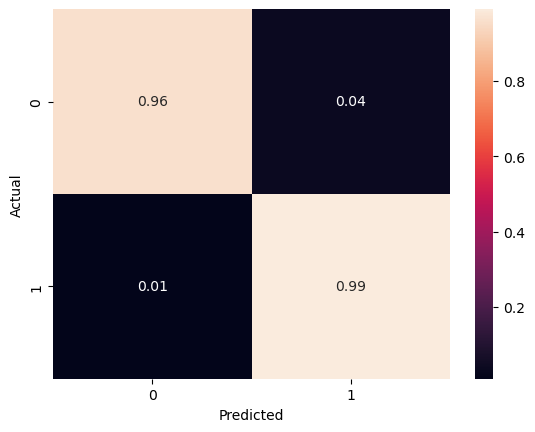

In [62]:
sns.heatmap(cmn3, annot=True, fmt='.2f', xticklabels=classifier3.classes_, yticklabels=classifier3.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')

**from the above plots we underdstood that the knn is prediction the data is perdicting at the 99% where we can say it is also a good model to predict the data*

**Decision Tree Classifier**

In [63]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)
y_test_pred = classifier.predict(X_test)
print(metrics.accuracy_score(y_test, y_test_pred))

0.9845297029702971


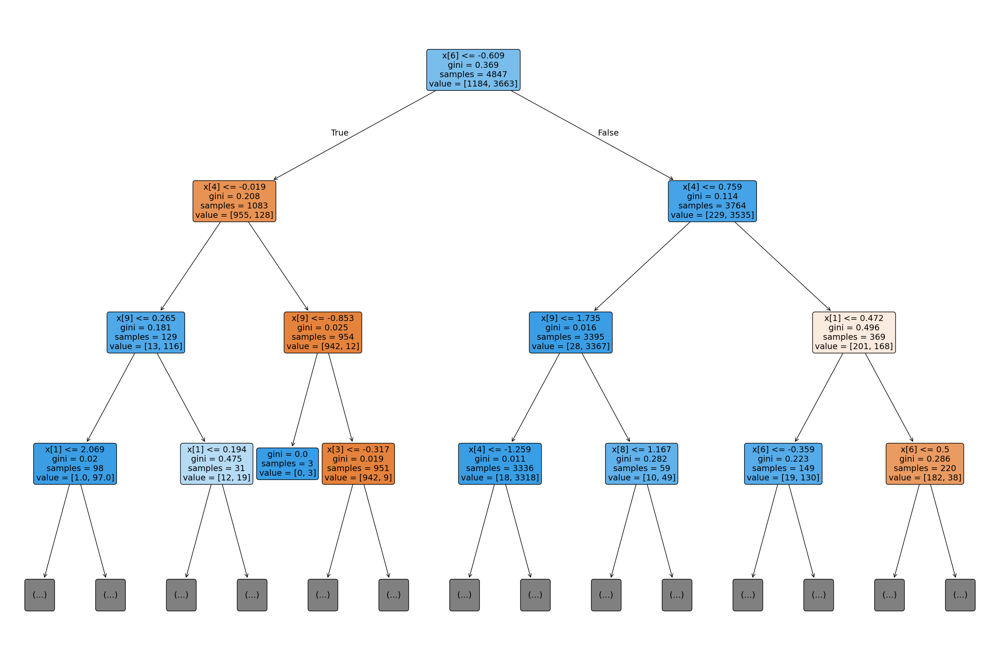

In [64]:
from sklearn.tree import plot_tree
plt.figure(figsize=(30,20))
f = plot_tree(classifier,max_depth=3,filled = True,rounded = True,fontsize = 14)
plt.show()

<Axes: >

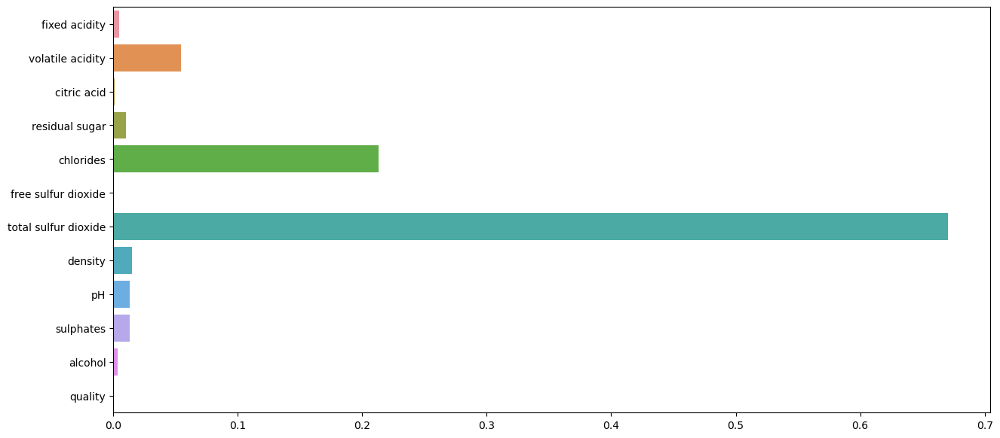

In [65]:
plt.figure(figsize=(15,7))
sns.barplot(x=classifier.feature_importances_,y=x.columns)

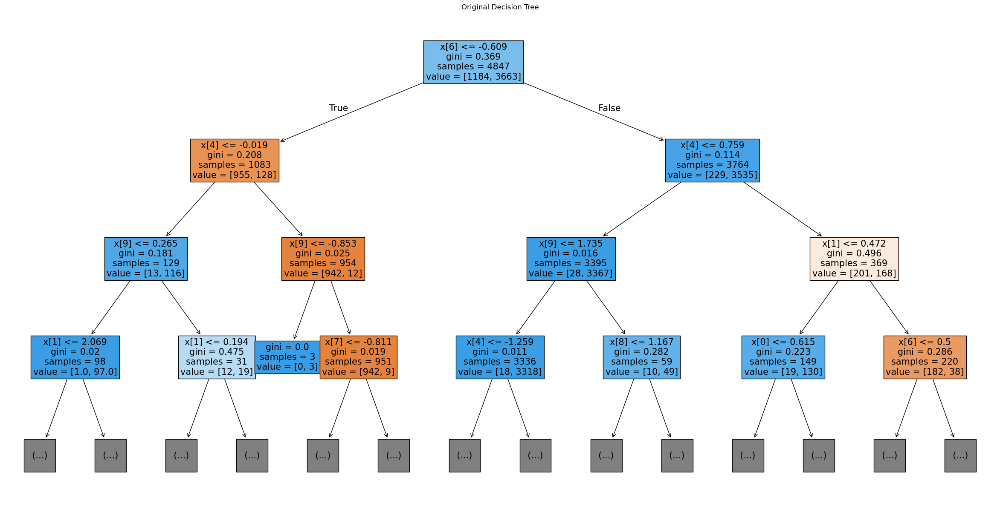

Accuracy before pruning: 0.9826732673267327


In [66]:
model = DecisionTreeClassifier(criterion="gini")
model.fit(X_train, y_train)
# Plot original tree
plt.figure(figsize=(30, 15))
plot_tree(model,max_depth=3,fontsize=15,filled=True)
plt.title("Original Decision Tree")
plt.show()

# Model Accuracy before pruning
accuracy_before_pruning = model.score(X_test, y_test)
print("Accuracy before pruning:", accuracy_before_pruning)

In [67]:
# Cost-complexity pruning (Post-pruning)
path = model.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [68]:
print(path, ccp_alphas, impurities, sep="\n")

{'ccp_alphas': array([0.00000000e+00, 1.37453557e-04, 1.76456556e-04, 1.91576527e-04,
       2.04207947e-04, 2.05557231e-04, 2.06313183e-04, 2.75084245e-04,
       3.07307274e-04, 3.32065981e-04, 3.43855306e-04, 3.61048071e-04,
       3.71363730e-04, 3.71363730e-04, 3.90909190e-04, 4.03656228e-04,
       4.06179080e-04, 4.08796918e-04, 5.41786141e-04, 5.89466238e-04,
       6.70130039e-04, 7.07359486e-04, 7.71293901e-04, 1.10581480e-03,
       1.21074071e-03, 1.26236906e-03, 1.33679208e-03, 1.49137569e-03,
       1.66351621e-03, 3.39420609e-03, 4.03622934e-03, 6.21265262e-03,
       1.79486900e-02, 3.68610166e-02, 3.95240271e-02, 2.33892810e-01]), 'impurities': array([0.        , 0.00082472, 0.00205992, 0.00244307, 0.00285149,
       0.00367372, 0.00388003, 0.00415511, 0.00722819, 0.00756025,
       0.00790411, 0.00826515, 0.00863652, 0.00900788, 0.00939879,
       0.00980245, 0.01061481, 0.0110236 , 0.01156539, 0.01215485,
       0.01282499, 0.01353234, 0.01430364, 0.01762108, 0.01883

In [69]:
# Train a series of decision trees with different alpha values
pruned_models = []
for ccp_alpha in ccp_alphas:
    # Create a decision tree classifier with the specified alpha value.
    pruned_model = DecisionTreeClassifier(criterion="gini", ccp_alpha=ccp_alpha)
    pruned_model.fit(X_train, y_train)
    pruned_models.append(pruned_model)

In [70]:
# Find the model with the best accuracy on test data
best_accuracy = 0
best_pruned_model = None
for pruned_model in pruned_models:
    accuracy = pruned_model.score(X_test, y_test)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_pruned_model = pruned_model

In [71]:
# Model Accuracy after pruning
accuracy_after_pruning = best_pruned_model.score(X_test, y_test)
print("Accuracy after pruning:", accuracy_after_pruning)

Accuracy after pruning: 0.9851485148514851


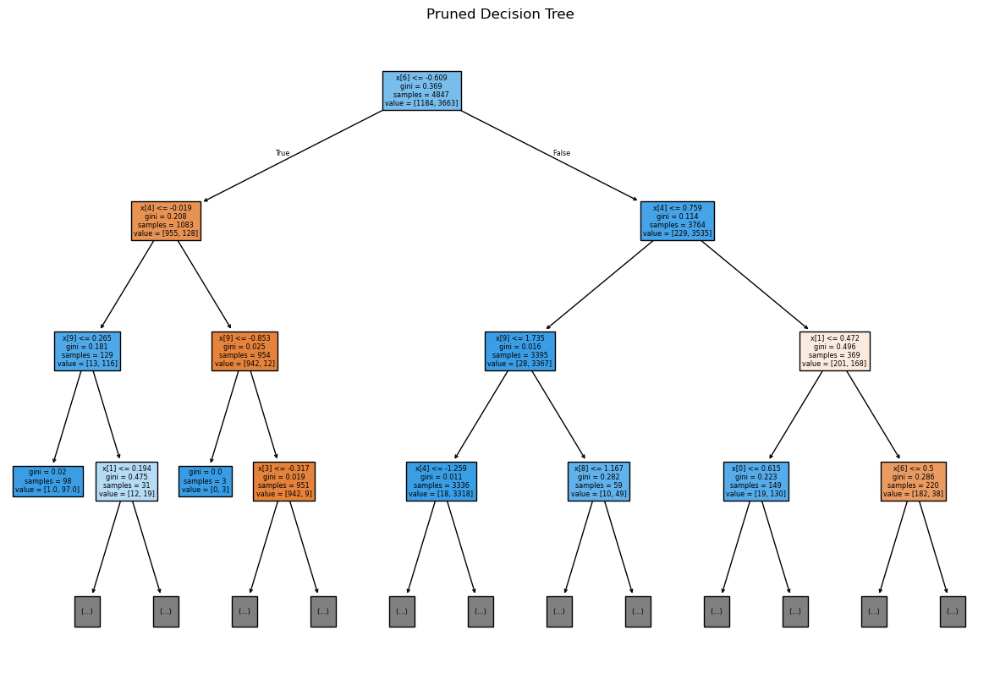

In [72]:
# Plot pruned tree
plt.figure(figsize=(15, 10))
plot_tree(best_pruned_model, filled=True,max_depth=3)
plt.title("Pruned Decision Tree")
plt.show()

In [73]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [74]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='deprecated', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Regression**

***Regression***

In [75]:
x1 = np.array(df1.drop(["quality"],axis=1))
y1 = np.array(df1["quality"])

In [76]:
from sklearn.model_selection import train_test_split
x1_train,x1_test,y1_train,y1_test = train_test_split(x1,y1,test_size=0.25,random_state=0)

In [77]:
from sklearn.preprocessing import RobustScaler
# creating normalization object
norm = RobustScaler()
# fit data
norm_fit = norm.fit(x1_train)
X_train = norm_fit.transform(x1_train)
X_test = norm_fit.transform(x1_test)
# display values
print(X_train)

[[-0.23076923  0.05882353 -0.14285714 ...  0.70588235  0.55555556
   0.        ]
 [ 0.07692308  0.05882353  1.28571429 ...  0.47058824 -0.05555556
   0.        ]
 [ 0.46153846 -0.52941176 -0.07142857 ... -0.29411765 -0.77777778
   0.        ]
 ...
 [ 0.23076923 -0.35294118  0.42857143 ... -0.94117647  0.44444444
   0.        ]
 [-0.23076923 -0.05882353 -0.21428571 ... -0.70588235  0.77777778
   0.        ]
 [ 1.23076923  0.23529412  0.21428571 ...  0.05882353 -0.16666667
   0.        ]]


In [78]:
# Default KNN
from sklearn.neighbors import KNeighborsRegressor

regression1 = KNeighborsRegressor()

regression1.fit(X_train, y1_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [79]:
# KNN with different parameters
regression2 = KNeighborsRegressor(n_neighbors=int(np.sqrt(X_train.shape[0])),
                                  weights="distance",
                                  algorithm="kd_tree",
                                  p=10,
                                  metric="minkowski")

regression2.fit(X_train, y1_train)

KNeighborsRegressor(algorithm='kd_tree', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=69, p=10,
                    weights='distance')

In [80]:
# KNN with different parameters
regression3 = KNeighborsRegressor(n_neighbors=int(np.sqrt(X_train.shape[0])),
                                  weights="distance",
                                  algorithm="ball_tree",
                                  p=10,
                                  metric="minkowski")

regression3.fit(X_train, y1_train)

KNeighborsRegressor(algorithm='ball_tree', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=69, p=10,
                    weights='distance')

In [81]:
regression1.effective_metric_, regression2.effective_metric_, regression3.effective_metric_

('euclidean', 'minkowski', 'minkowski')

In [82]:
regression1.n_features_in_, regression2.n_features_in_, regression3.n_features_in_

(12, 12, 12)

In [83]:
%%time
y_test_pred1_r = regression1.predict(X_test)
y_test_pred2_r = regression2.predict(X_test)
y_test_pred3_r = regression3.predict(X_test)

CPU times: total: 3.12 s
Wall time: 4.29 s


In [84]:


from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE using mean_squared_error
print("KNN Version 1:", np.sqrt(mean_squared_error(y1_test, y_test_pred1_r)))
print("KNN Version 2:", np.sqrt(mean_squared_error(y1_test, y_test_pred2_r)))
print("KNN Version 3:", np.sqrt(mean_squared_error(y1_test, y_test_pred3_r)))

KNN Version 1: 0.6907271244102403
KNN Version 2: 0.6222080053791216
KNN Version 3: 0.6222080053791216


In [85]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error # Import mean_squared_error
import numpy as np

X = np.array(df1.drop(["quality"],axis=1))
y = np.array(df1["quality"])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

knn = KNeighborsRegressor()

knn.fit(X_train, y_train)

y_pred = knn.predict(X_test) # Generate predictions

# Evaluating the model
rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred)) # Calculate RMSE from MSE
print(f"Root Mean Squared Error of KNN: {rmse_knn}") # Print RMSE

Root Mean Squared Error of KNN: 0.8077287555697502


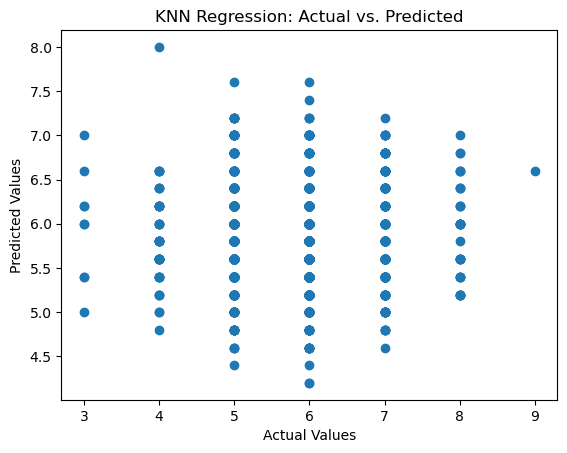

In [86]:
plt.scatter(y1_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("KNN Regression: Actual vs. Predicted")
plt.show()

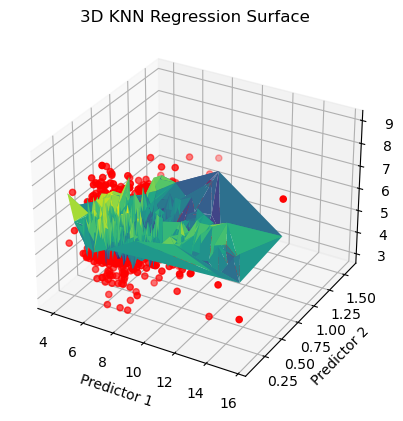

In [87]:
from mpl_toolkits.mplot3d import Axes3D

# Assuming X has two dimensions
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_test[:, 0], X_test[:, 1], y1_test, color='red')
ax.plot_trisurf(X_test[:, 0], X_test[:, 1], y_pred, cmap='viridis')
ax.set_xlabel("Predictor 1")
ax.set_ylabel("Predictor 2")
ax.set_zlabel("Target Variable")
plt.title("3D KNN Regression Surface")
plt.show()

In [88]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error # Import mean_squared_error instead of root_mean_squared_error
import numpy as np # Import numpy

# Create Decision Tree Regressor model
dt_regressor = DecisionTreeRegressor(random_state=42)

# Train the model
dt_regressor.fit(X_train, y_train)

# Make predictions
y_pred = dt_regressor.predict(X_test)

# Evaluate the model
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred)) # Calculate RMSE from MSE using np.sqrt()

print(f"Root Mean Squared Error: {rmse_dt}")

Root Mean Squared Error: 0.8577688072742407


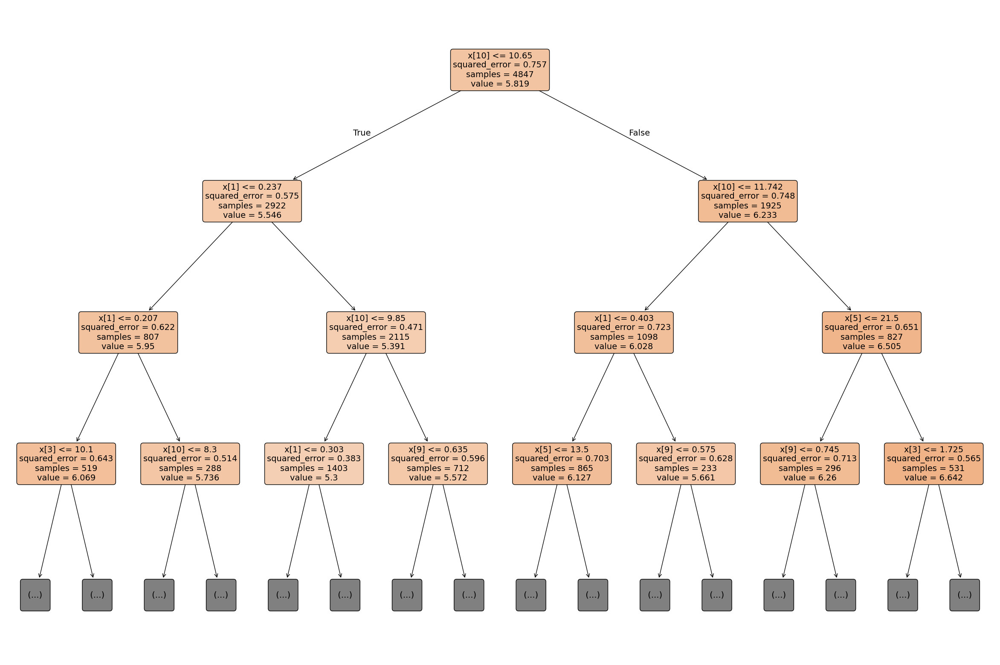

In [89]:
from sklearn.tree import plot_tree
plt.figure(figsize=(30,20))
plot_tree(dt_regressor,max_depth=3,filled = True,rounded = True,fontsize = 14)
plt.show()

In [90]:
x2 = df1.drop(["quality"],axis=1)

<Axes: >

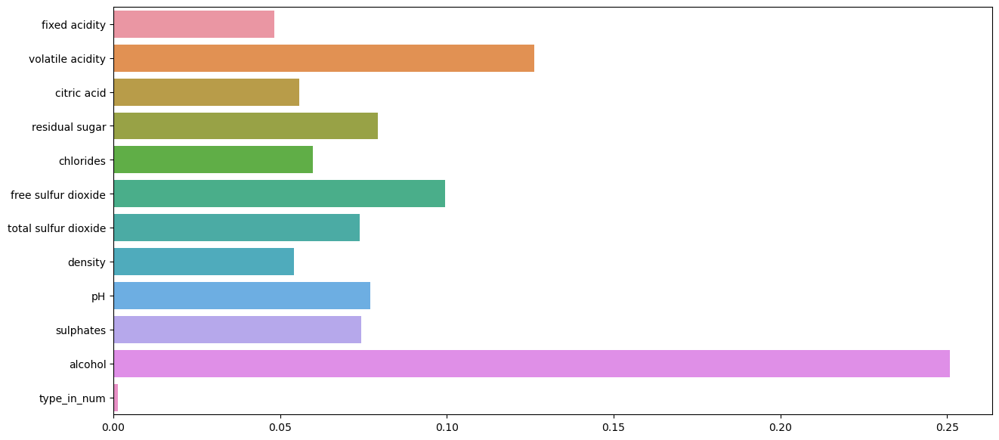

In [91]:
plt.figure(figsize=(15,7))
sns.barplot(x=dt_regressor.feature_importances_,y=x2.columns)

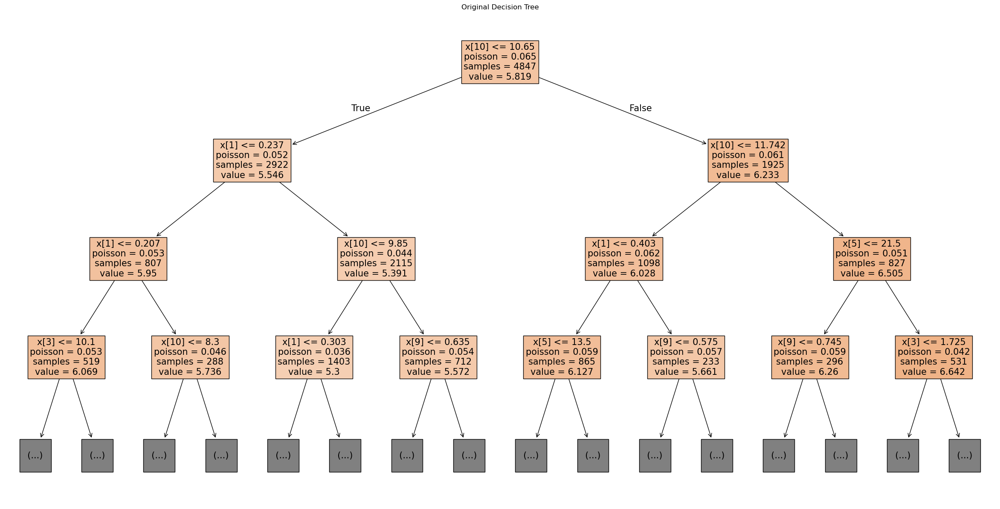

Accuracy before pruning: 0.0636524877591369


In [92]:
model = DecisionTreeRegressor(criterion="poisson")
model.fit(X_train, y_train)
# Plot original tree
plt.figure(figsize=(30, 15))
plot_tree(model,max_depth=3,fontsize=15,filled=True)
plt.title("Original Decision Tree")
plt.show()

# Model Accuracy before pruning
accuracy_before_pruning = model.score(X_test, y_test)
print("Accuracy before pruning:", accuracy_before_pruning)

In [93]:
# Cost-complexity pruning (Post-pruning)
path = model.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [94]:
print(path, ccp_alphas, impurities, sep="\n")

{'ccp_alphas': array([0.00000000e+00, 5.82905193e-06, 6.47582546e-06, 6.58139910e-06,
       6.88220934e-06, 6.88220934e-06, 6.88220934e-06, 7.17775715e-06,
       7.21853077e-06, 7.30011757e-06, 7.30011757e-06, 7.37744743e-06,
       7.37744743e-06, 7.37744743e-06, 7.44194792e-06, 7.44194792e-06,
       7.61960144e-06, 7.65099437e-06, 7.67890988e-06, 7.78216324e-06,
       7.81192576e-06, 7.88032090e-06, 7.88032090e-06, 7.94296658e-06,
       7.94296658e-06, 7.94296658e-06, 7.94296658e-06, 8.04296313e-06,
       8.15713490e-06, 8.15713490e-06, 8.20801873e-06, 8.22960284e-06,
       8.25378551e-06, 8.25378551e-06, 8.25378551e-06, 8.33277332e-06,
       8.33277332e-06, 8.33277332e-06, 8.39853479e-06, 8.39853479e-06,
       8.48518170e-06, 8.50176118e-06, 8.54301313e-06, 8.55164346e-06,
       8.62725012e-06, 8.63918206e-06, 8.66467389e-06, 8.72650459e-06,
       8.73394231e-06, 8.80620424e-06, 8.81061510e-06, 8.89995669e-06,
       8.89995669e-06, 8.95608173e-06, 9.10901243e-06, 9.10901

In [95]:
# Train a series of decision trees with different alpha values
pruned_models = []
for ccp_alpha in ccp_alphas:
    # Create a decision tree classifier with the specified alpha value.
    pruned_model = DecisionTreeRegressor(criterion="poisson", ccp_alpha=ccp_alpha)
    pruned_model.fit(X_train, y_train)
    pruned_models.append(pruned_model)

In [96]:
# Find the model with the best accuracy on test data
best_accuracy = 0
best_pruned_model = None
for pruned_model in pruned_models:
    accuracy = pruned_model.score(X_test, y_test)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_pruned_model = pruned_model

In [97]:
# Model Accuracy after pruning
accuracy_after_pruning = best_pruned_model.score(X_test, y_test)
print("Accuracy after pruning:", accuracy_after_pruning)

Accuracy after pruning: 0.3258434112571502


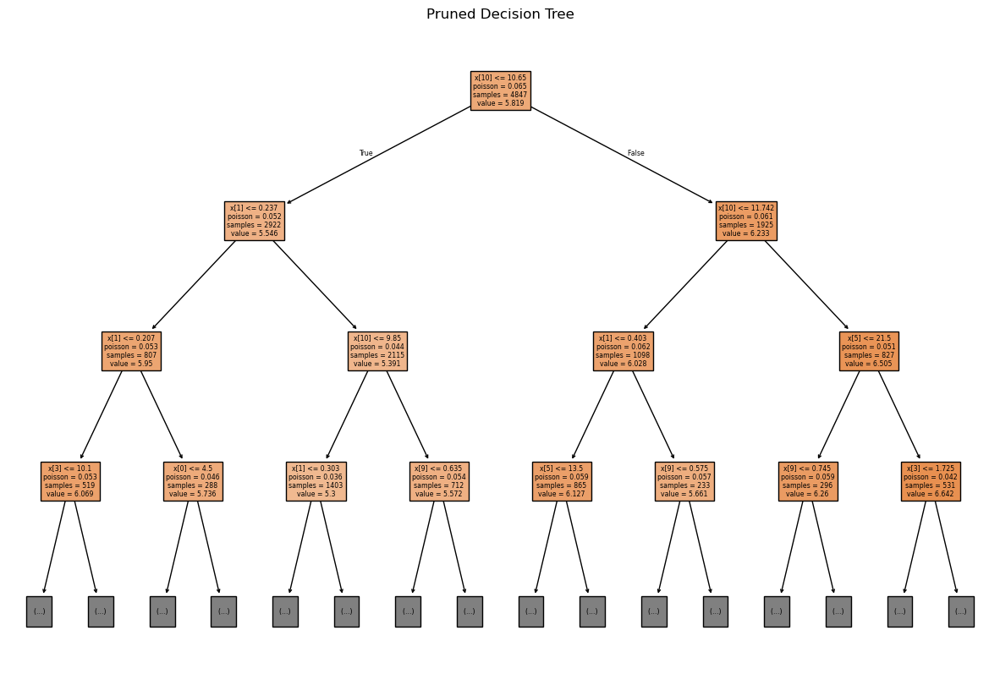

In [98]:
# Plot pruned tree
plt.figure(figsize=(15, 10))
plot_tree(best_pruned_model, filled=True,max_depth=3)
plt.title("Pruned Decision Tree")
plt.show()

In [99]:
from sklearn.linear_model import LinearRegression
# Create Linear Regression model
linear_regressor = LinearRegression()
# Train the model
linear_regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, positive=False)

In [100]:
print('y intercept: ',linear_regressor.intercept_)

y intercept:  96.7861390597648


In [101]:
y_train_pred = linear_regressor.predict(X_train)

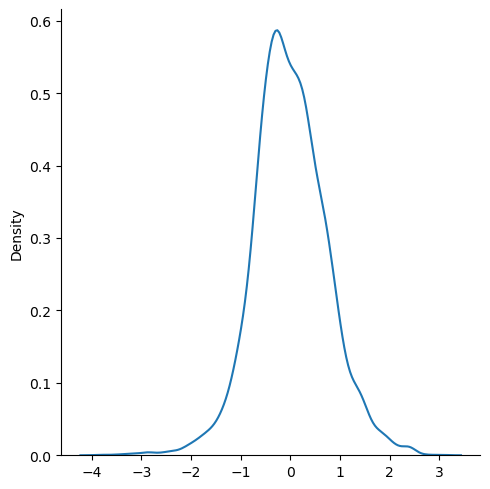

In [102]:
residual = y_train - y_train_pred
sns.displot(residual, kind='kde')

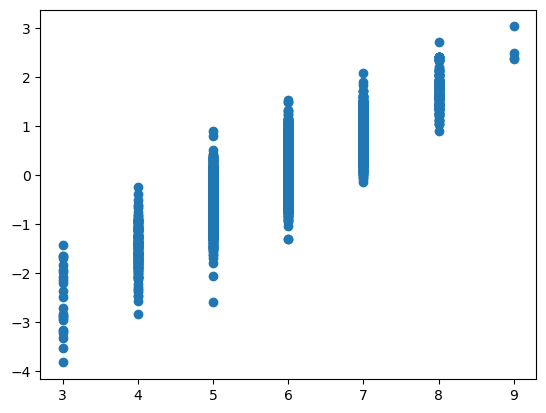

In [103]:
plt.scatter(y_train, residual)
plt.show()

In [104]:
from sklearn import metrics

print('Mean Absolute Error: ', metrics.mean_absolute_error(y_test, y_test_pred))
print('Mean Squared Error: ', metrics.mean_squared_error(y_test, y_test_pred))
print('Root Mean Squared Error: ', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Mean Absolute Error:  5.074876237623762
Mean Squared Error:  26.72339108910891
Root Mean Squared Error:  5.169467195863507


In [105]:
metrics.median_absolute_error(y_test, y_test_pred)

5.0

In [106]:
print(metrics.r2_score(y_test, y_test_pred))

-33.29700366083263


In [107]:
r2 = metrics.r2_score(y_test, y_test_pred)
n = len(y_test)
k = X_test.shape[1]
r2_adj = 1 - (1-r2)*(n-1)/(n-k-1)
print(r2_adj)

-33.553749789298


<Axes: ylabel='Count'>

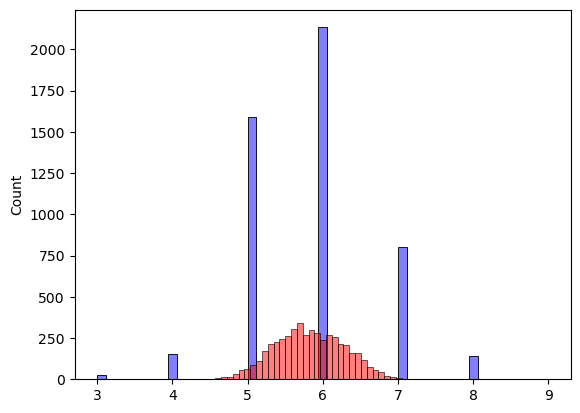

In [108]:
sns.histplot(y_train, color='blue', alpha=0.5)
sns.histplot(y_train_pred, color='red', alpha=0.5)

In [110]:
from sklearn.pipeline import Pipeline
from sklearn.metrics import root_mean_squared_error, r2_score
x1 = np.array(df1.drop(["quality"],axis=1))
y1 = np.array(df1["quality"])
from sklearn.model_selection import train_test_split
x1_train,x1_test,y1_train,y1_test = train_test_split(x1,y1,test_size=0.25,random_state=0)
from sklearn.preprocessing import RobustScaler
# creating normalization object
norm = RobustScaler()
# fit data
norm_fit = norm.fit(x1_train)
X_train = norm_fit.transform(x1_train)
X_test = norm_fit.transform(x1_test)

pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

pipeline_dtr = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', DecisionTreeRegressor(random_state=42))
])

pipeline_knnr = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', KNeighborsRegressor())
])

# Train and predict with Linear Regression
pipeline_lr.fit(X_train, y1_train)
y_pred_lr = pipeline_lr.predict(X_test)

# Train and predict with Decision Tree Regression
pipeline_dtr.fit(X_train, y1_train)
y_pred_dtr = pipeline_dtr.predict(X_test)

# Train and predict with KNN Regression
pipeline_knnr.fit(X_train, y1_train)
y_pred_knnr = pipeline_knnr.predict(X_test)

# Calculate evaluation scores for Linear Regression
rmse_lr = root_mean_squared_error(y1_test, y_pred_lr)
r2_lr = r2_score(y1_test, y_pred_lr)

# Calculate evaluation scores for Decision Tree Regression
rmse_dtr = root_mean_squared_error(y1_test, y_pred_dtr)
r2_dtr = r2_score(y1_test, y_pred_dtr)

# Calculate evaluation scores for KNN Regression
rmse_knnr = root_mean_squared_error(y1_test, y_pred_knnr)
r2_knnr = r2_score(y1_test, y_pred_knnr)

print(f"Linear Regression RMSE: {rmse_lr:.2f}, R²: {r2_lr:.2f}")
print(f"Decision Tree Regression RMSE: {rmse_dtr:.2f}, R²: {r2_dtr:.2f}")
print(f"KNN Regression RMSE: {rmse_knnr:.2f}, R²: {r2_knnr:.2f}")

Linear Regression RMSE: 0.71, R²: 0.30
Decision Tree Regression RMSE: 0.83, R²: 0.02
KNN Regression RMSE: 0.69, R²: 0.33


**Regression**
The regression models, on the other hand, showed more moderate performance in predicting the exact quality scores:

    Linear Regression: RMSE = 0.71, R² = 0.30
    Decision Tree Regression: RMSE = 0.83, R² = 0.02
    KNN Regression: RMSE = 0.69, R² = 0.33

The KNN Regression model performed the best among the regression models, with the lowest RMSE and the highest R² value. However, the overall lower R² values indicate that the regression models struggle to explain a significant portion of the variance in the quality scores. This suggests that predicting exact quality scores is inherently more challenging and may require more sophisticated models or additional features to improve performance.

In [111]:
from sklearn.metrics import accuracy_score
x = df1.drop(["type_in_num"],axis=1)
y = df1["type_in_num"]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=40)
from sklearn.preprocessing import RobustScaler
# creating normalization object
norm = RobustScaler()
# fit data
norm_fit = norm.fit(x_train)
X_train = norm_fit.transform(x_train)
X_test = norm_fit.transform(x_test)
# display values
#print(X_train)
pipeline_dt = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', KNeighborsClassifier())
])

pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42))
])

# List of pipelines
pipelines = [pipeline_dt, pipeline_knn, pipeline_lr]

# Dictionary of pipeline names for convenience
pipeline_dict = {0: 'Decision Tree Classifier', 1: 'KNN Classifier', 2: 'Logistic Regression'}

# Evaluate each pipeline
for idx, pipeline in enumerate(pipelines):

    # Perform cross-validation
    cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
    print(f"{pipeline_dict[idx]}: Accuracy = {cv_scores.mean():.2f}")

Decision Tree Classifier: Accuracy = 0.98
KNN Classifier: Accuracy = 0.99
Logistic Regression: Accuracy = 0.99


**Classification**

The classification models demonstrated impressive performance, with exceptionally high accuracy scores:

    Decision Tree Classifier: Accuracy = 0.98
    KNN Classifier: Accuracy = 0.99
    Logistic Regression: Accuracy = 0.99

These results indicate that the classification models are highly effective in predicting the categorical quality ratings of wine. Both the KNN and Logistic Regression classifiers achieved near-perfect accuracy, making them excellent choices for practical applications where categorical quality assessment is needed.

**`Conclusion`**

*The analysis of the Wine Quality dataset underscores the effectiveness of classification models in predicting wine quality categories, while also revealing the complexities involved in predicting exact scores with regression models. Leveraging the strengths of classification models and exploring enhancements for regression models will enable more informed decisions in the wine industry, ultimately leading to improved wine quality and consumer satisfaction. This project provides a robust foundation for further research and optimization in wine quality prediction..*